# HR Analytics Project- Understanding the Attrition in HR

### Project Description

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

### HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

### Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.
How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

### Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.


### Dataset Link- 

•	https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('HR-Employee-Attrition.csv')
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
type(df)

pandas.core.frame.DataFrame

In [4]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [6]:
df.sample(3)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
748,26,Yes,Non-Travel,265,Sales,29,2,Medical,1,1037,...,4,80,0,7,6,3,2,2,2,2
439,31,Yes,Travel_Frequently,534,Research & Development,20,3,Life Sciences,1,587,...,1,80,0,12,2,3,1,0,0,0
1274,31,No,Travel_Rarely,196,Sales,29,4,Marketing,1,1784,...,1,80,2,13,3,3,12,7,5,7


In [7]:
df.shape

(1470, 35)

In [8]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [10]:
# Let's check the number of unique values present in the dataset

df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [11]:
df.drop(columns=['StandardHours', 'EmployeeCount', 'Over18'], axis=1, inplace=True)

In [12]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,...,3,4,0,17,3,2,9,6,0,8


In [13]:
df.drop(['EmployeeNumber'], axis = 1, inplace = True)

In [14]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,3,4,0,17,3,2,9,6,0,8


In [15]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

<AxesSubplot:>

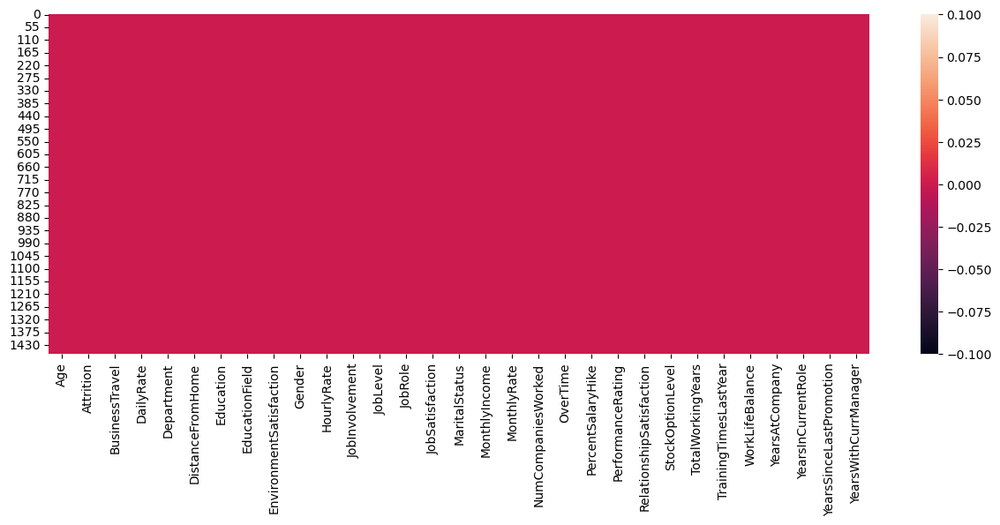

In [16]:
plt.figure(figsize=(15,5))

sns.heatmap(df.isnull())

In [17]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole  

In [18]:
# Now, let's check the uniqueness of the target variable, i.e., 'Attrition'

df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

In [19]:
# Now, let's check the value count of the target variable, i.e., 'W'

df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

### Statistical Description of the Dataset

In [20]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


<b>This provides the statistical description of the data set. As there are no negative / invalid values present in the dataset, we can say that the dataset appears perfect.</b>

<b>By looking at the description of the data, we can conclude the following things:</b>

* As the count of all the columns is the same, we can conclude that are no null values in the dataset.
* Some columns have mean less than the median. Thus, we can conclude that these columns are skewed to the left.
* Some columns have mean greater than the median. Thus, we can conclude that these columns are skewed to the right.
* In case of the column 'Age', the mean is just a little more than the median. Thus, we can conclude that the data is almost normally distributed or symmetrical.
* We can see that there is a huge difference in max and 75% percentile(3rd quantile).
* From all these observations, we can conclude that outliers are present in many of these columns.

<AxesSubplot:>

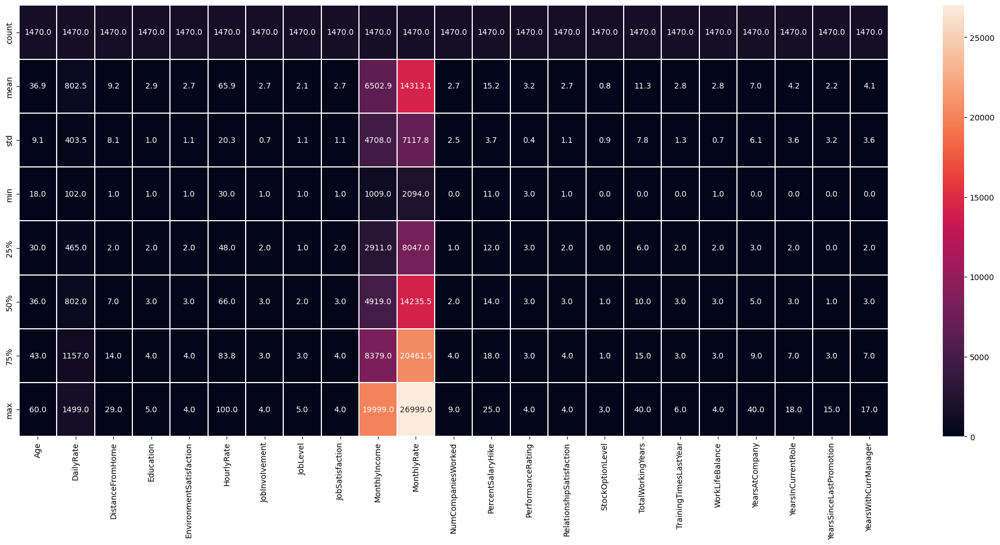

In [21]:
# Now, let's visualize the statistics of the columns using Heatmap

plt.figure(figsize=(25,10))

sns.heatmap(df.describe(), linewidths=0.1, fmt='0.1f', annot=True)

In [22]:
# Now, let's separate the categorical columns

categorical_columns = []

for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


In [23]:
# Now, let's separate the numerical columns

numerical_columns = []

for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


### Data Visualization

### Univariate Analysis

<b> Now, let's visualize the categoorical columns</b>

No     1233
Yes     237
Name: Attrition, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='count'>

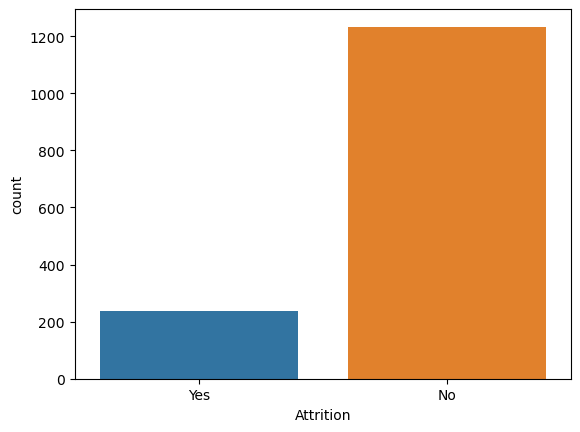

In [24]:
print(df['Attrition'].value_counts())
sns.countplot(df['Attrition'])

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


<AxesSubplot:xlabel='BusinessTravel', ylabel='count'>

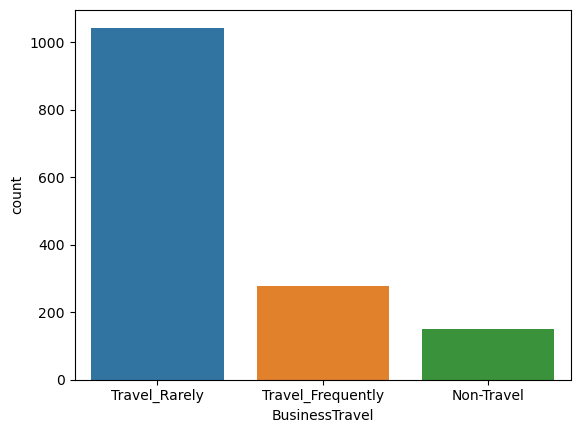

In [25]:
print(df['BusinessTravel'].value_counts())
sns.countplot(df['BusinessTravel'])

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


<AxesSubplot:xlabel='Department', ylabel='count'>

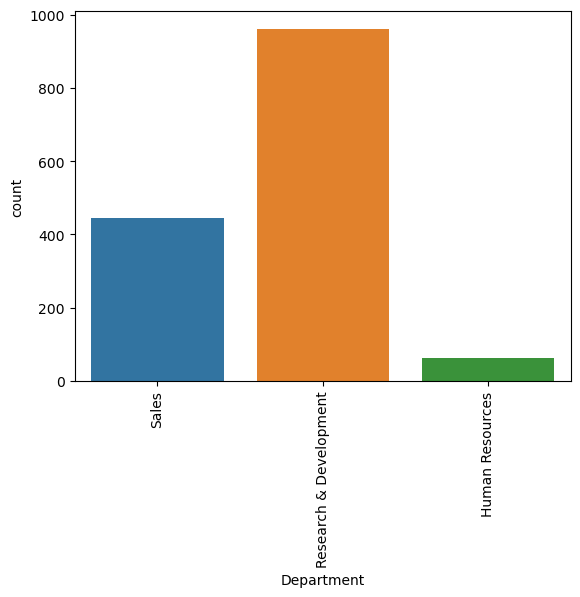

In [26]:
print(df['Department'].value_counts())
plt.xticks(rotation = 90)
sns.countplot(df['Department'])

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


<AxesSubplot:xlabel='EducationField', ylabel='count'>

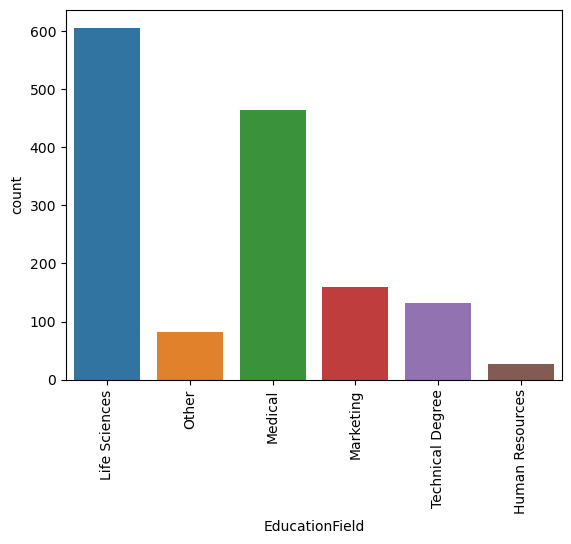

In [27]:
print(df['EducationField'].value_counts())
plt.xticks(rotation = 90)
sns.countplot(df['EducationField'])

Male      882
Female    588
Name: Gender, dtype: int64


<AxesSubplot:xlabel='Gender', ylabel='count'>

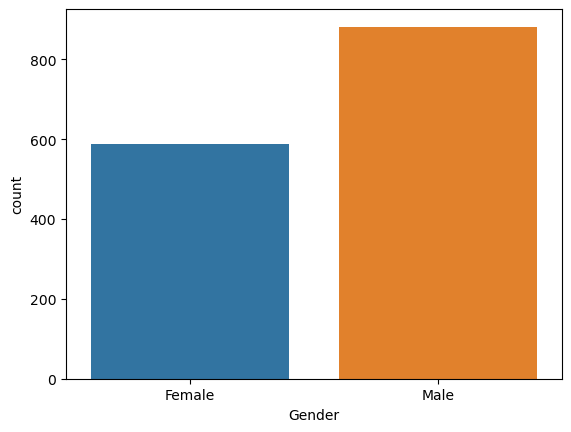

In [28]:
print(df['Gender'].value_counts())
sns.countplot(df['Gender'])

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


<AxesSubplot:xlabel='JobRole', ylabel='count'>

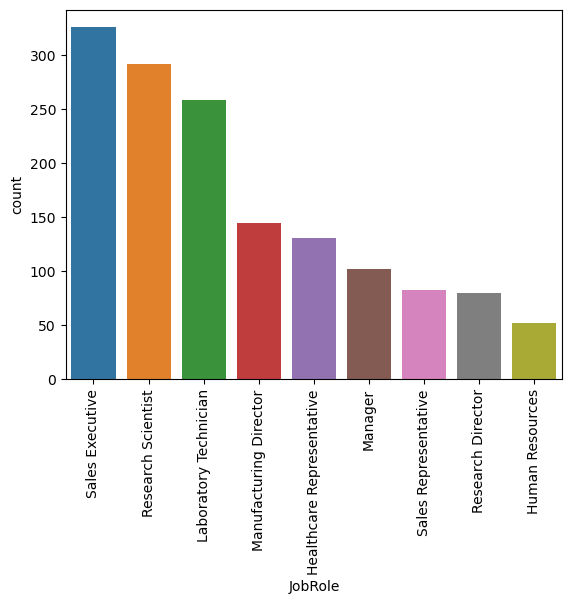

In [29]:
print(df['JobRole'].value_counts())
plt.xticks(rotation = 90)
sns.countplot(df['JobRole'])

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

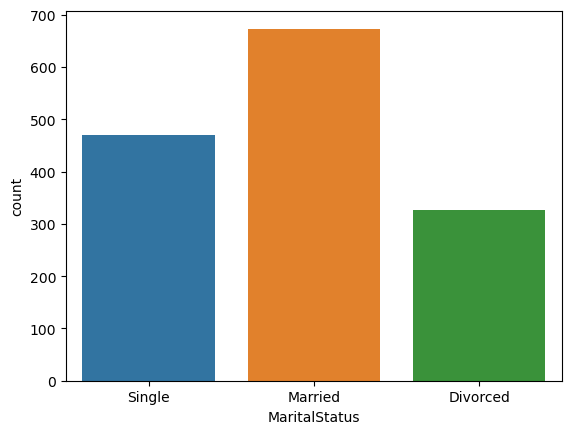

In [30]:
print(df['MaritalStatus'].value_counts())
sns.countplot(df['MaritalStatus'])

No     1054
Yes     416
Name: OverTime, dtype: int64


<AxesSubplot:xlabel='OverTime', ylabel='count'>

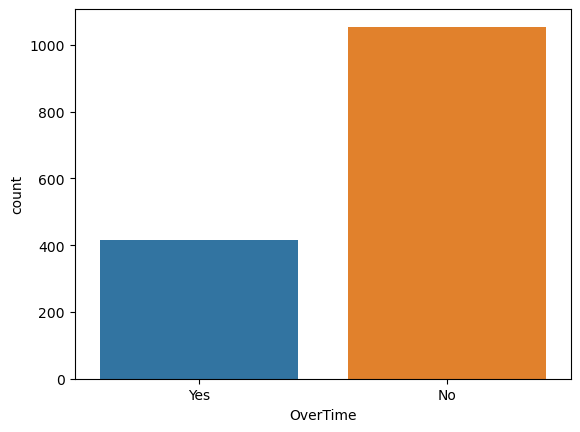

In [31]:
print(df['OverTime'].value_counts())
sns.countplot(df['OverTime'])

### Checking the distribution of data for numerical columns

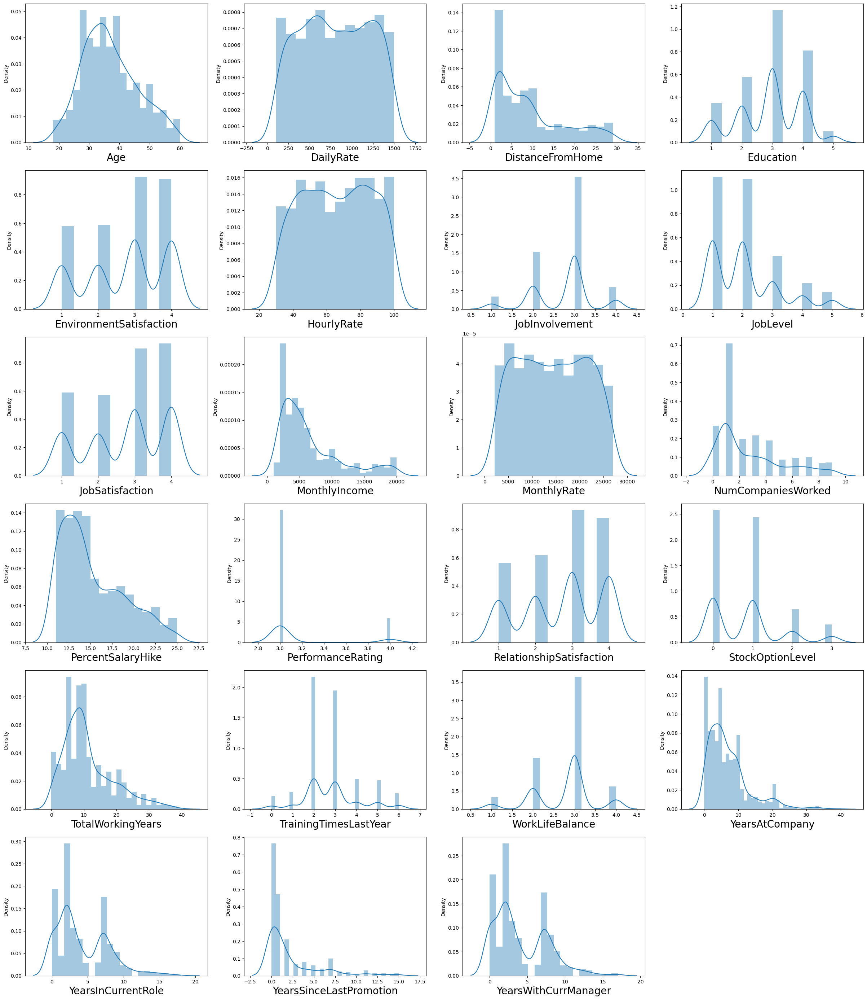

In [32]:
plt.figure(figsize=(30,35))
plotnumber = 1

for column in numerical_columns:
    if plotnumber<=24:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.show()

<b>From the distribution plot above, we can observe the following things:</b>     
* The column 'Age' is normally distributed, and there is no skewness present.
* The columns 'DailyRate', 'HourlyRate' and 'MonthlyRate' are almost normally distributed.
* All the remaining columns are not normally distributed, and skewness is present in them.</b>

# Bivariate Analysis

<AxesSubplot:xlabel='Attrition', ylabel='Age'>

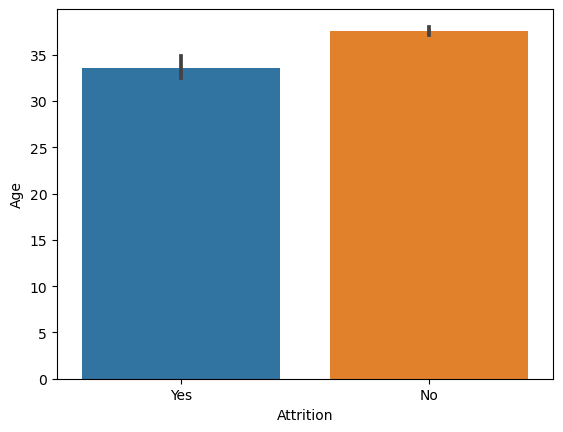

In [33]:
x = df['Attrition']
y = df['Age']
sns.barplot(x,y)

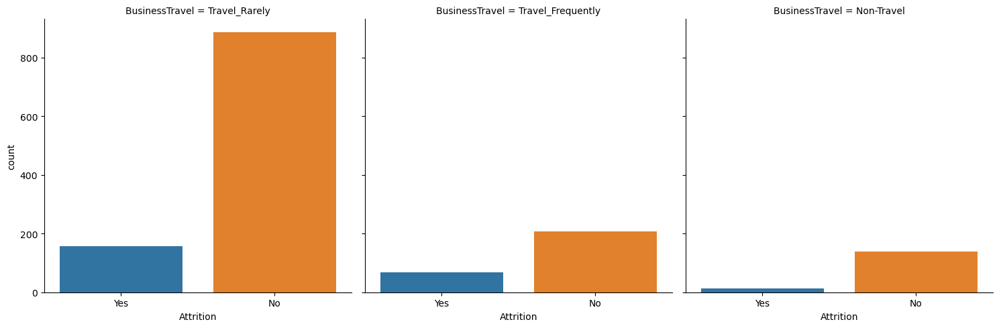

In [34]:
sns.factorplot(data=df, kind='count', x='Attrition', col='BusinessTravel')

In [35]:
pd.crosstab(columns=[df.Attrition],index=[df.BusinessTravel],margins=True,normalize='index') # Set normalize=index to view row-wise %.

Attrition,No,Yes
BusinessTravel,,
Non-Travel,0.920000,0.080000
Travel_Frequently,0.750903,0.249097
Travel_Rarely,0.850431,0.149569
All,0.838776,0.161224


<AxesSubplot:xlabel='Attrition', ylabel='DailyRate'>

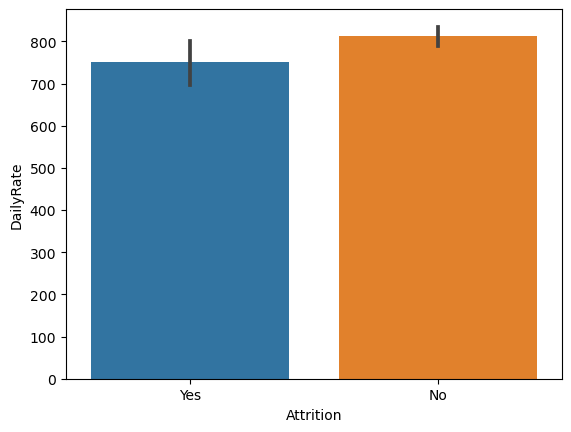

In [36]:
x = df['Attrition']
y = df['DailyRate']
sns.barplot(x,y)

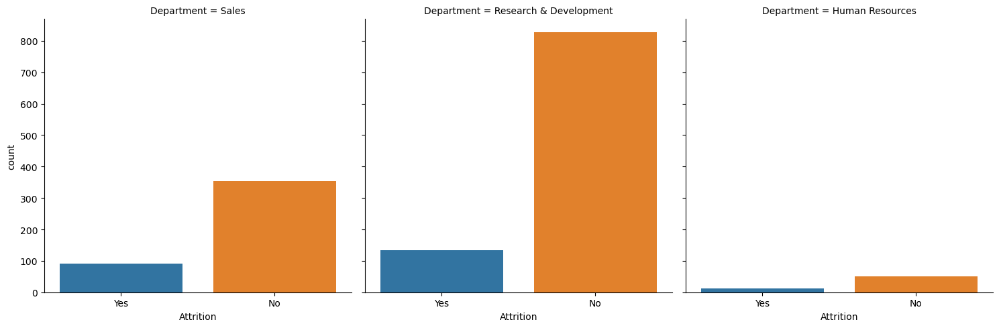

In [37]:
sns.factorplot(data=df, kind='count', x='Attrition', col='Department')

<AxesSubplot:xlabel='Attrition', ylabel='DistanceFromHome'>

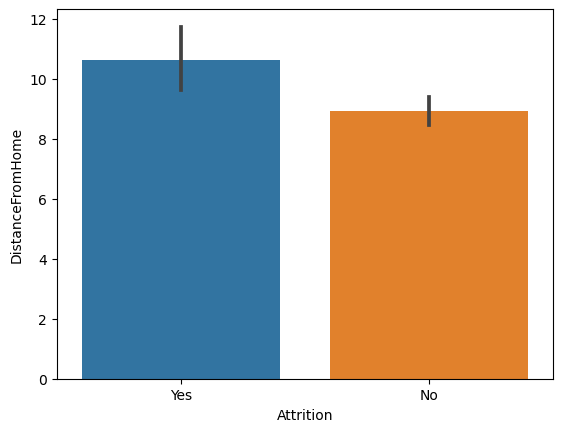

In [38]:
x = df['Attrition']
y = df['DistanceFromHome']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='Education'>

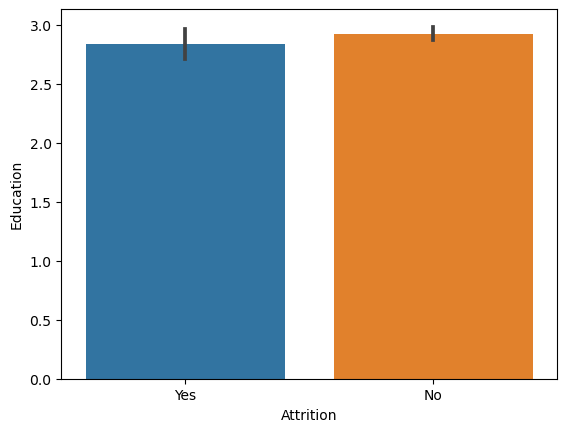

In [39]:
x = df['Attrition']
y = df['Education']
sns.barplot(x,y)

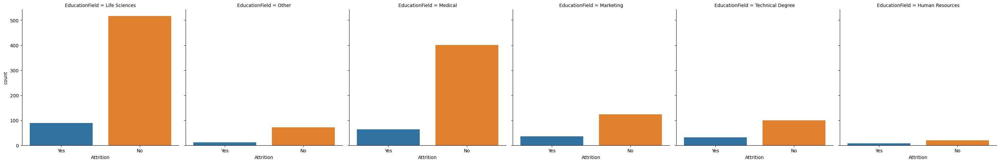

In [40]:
sns.factorplot(data=df, kind='count', x='Attrition', col='EducationField')

In [41]:
pd.crosstab(columns=[df.Attrition],index=[df.EducationField],margins=True,normalize='index') # Set normalize=index to view row-wise %.

Attrition,No,Yes
EducationField,,
Human Resources,0.740741,0.259259
Life Sciences,0.853135,0.146865
Marketing,0.779874,0.220126
Medical,0.864224,0.135776
Other,0.865854,0.134146
Technical Degree,0.757576,0.242424
All,0.838776,0.161224


<AxesSubplot:xlabel='Attrition', ylabel='EnvironmentSatisfaction'>

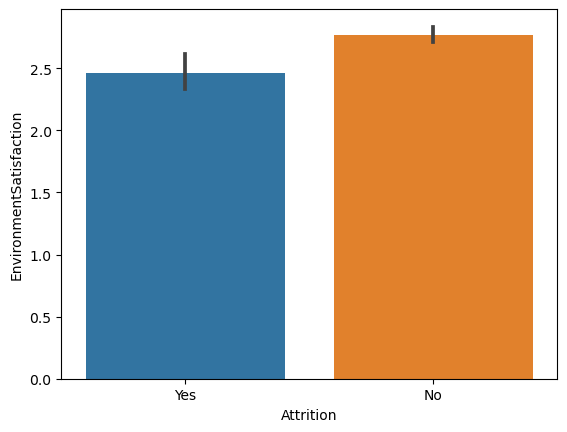

In [42]:
x = df['Attrition']
y = df['EnvironmentSatisfaction']
sns.barplot(x,y)

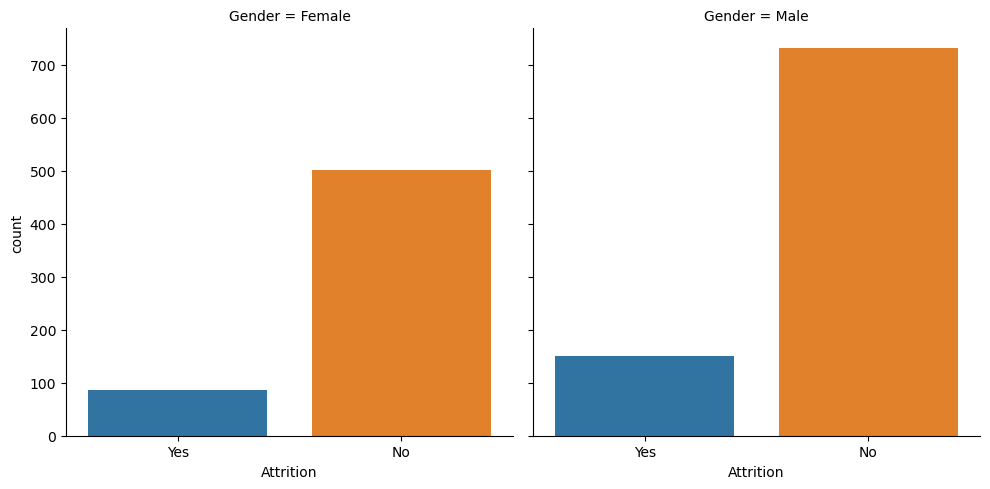

In [43]:
sns.factorplot(data=df, kind='count', x='Attrition', col='Gender')

In [44]:
pd.crosstab(columns=[df.Attrition], index=[df.Gender], margins=True, normalize='index') # Set normalize=index to view row-wise %.

Attrition,No,Yes
Gender,,
Female,0.852041,0.147959
Male,0.829932,0.170068
All,0.838776,0.161224


<AxesSubplot:xlabel='Attrition', ylabel='HourlyRate'>

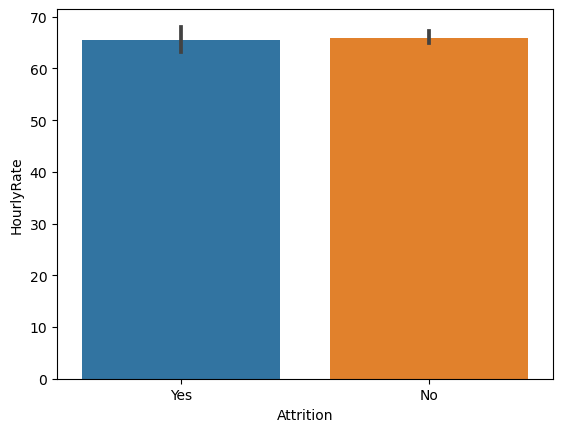

In [45]:
x = df['Attrition']
y = df['HourlyRate']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='JobInvolvement'>

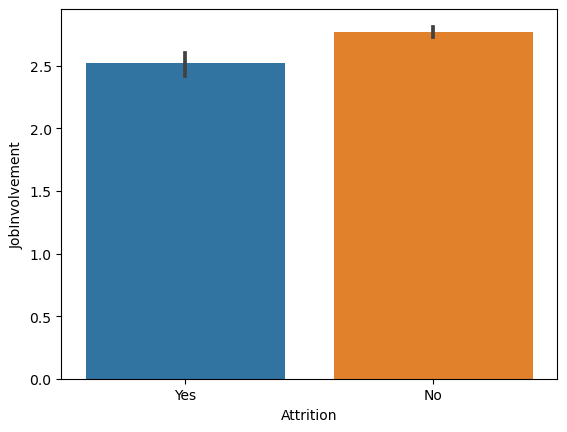

In [46]:
x = df['Attrition']
y = df['JobInvolvement']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='JobLevel'>

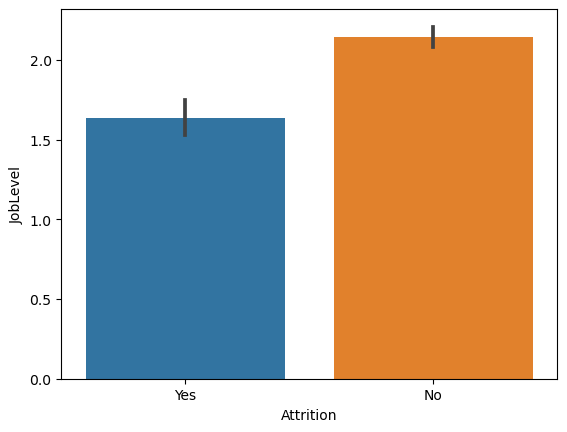

In [47]:
x = df['Attrition']
y = df['JobLevel']
sns.barplot(x,y)

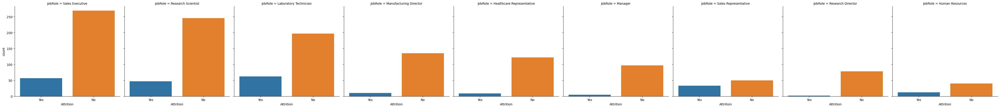

In [48]:
sns.factorplot(data=df, kind='count', x='Attrition', col='JobRole')

In [49]:
pd.crosstab(columns=[df.Attrition], index=[df.JobRole], margins=True, normalize='index') # Set normalize=index to view row-wise %.

Attrition,No,Yes
JobRole,,
Healthcare Representative,0.931298,0.068702
Human Resources,0.769231,0.230769
Laboratory Technician,0.760618,0.239382
Manager,0.950980,0.049020
Manufacturing Director,0.931034,0.068966
Research Director,0.975000,0.025000
Research Scientist,0.839041,0.160959
Sales Executive,0.825153,0.174847
Sales Representative,0.602410,0.397590


<AxesSubplot:xlabel='Attrition', ylabel='JobSatisfaction'>

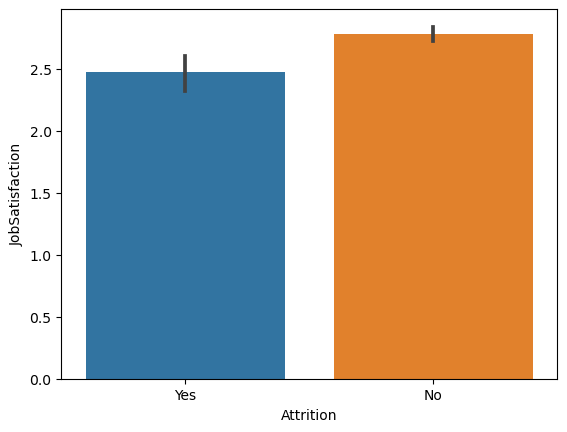

In [50]:
x = df['Attrition']
y = df['JobSatisfaction']
sns.barplot(x,y)

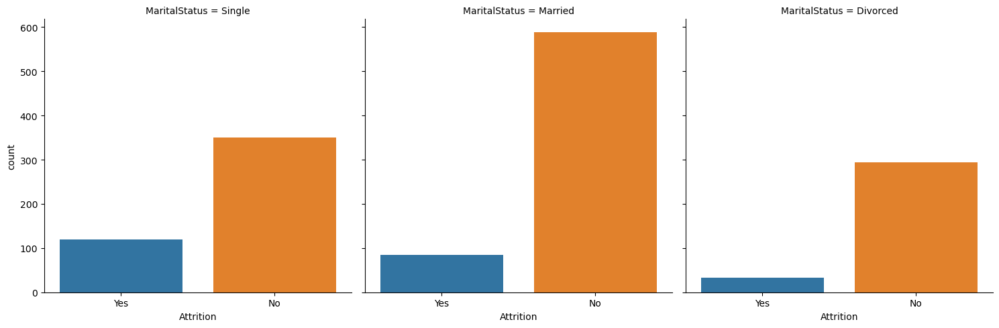

In [51]:
sns.factorplot(data=df, kind='count', x='Attrition', col='MaritalStatus')

In [52]:
pd.crosstab(columns=[df.Attrition], index=[df.MaritalStatus], margins=True, normalize='index') # Set normalize=index to view row-wise %.

Attrition,No,Yes
MaritalStatus,,
Divorced,0.899083,0.100917
Married,0.875186,0.124814
Single,0.744681,0.255319
All,0.838776,0.161224


<AxesSubplot:xlabel='Attrition', ylabel='MonthlyIncome'>

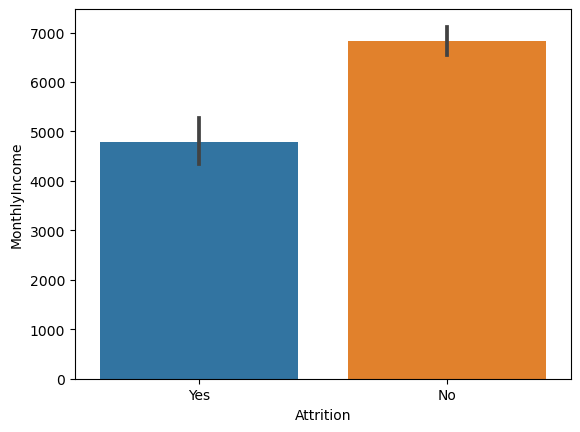

In [53]:
x = df['Attrition']
y = df['MonthlyIncome']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='MonthlyRate'>

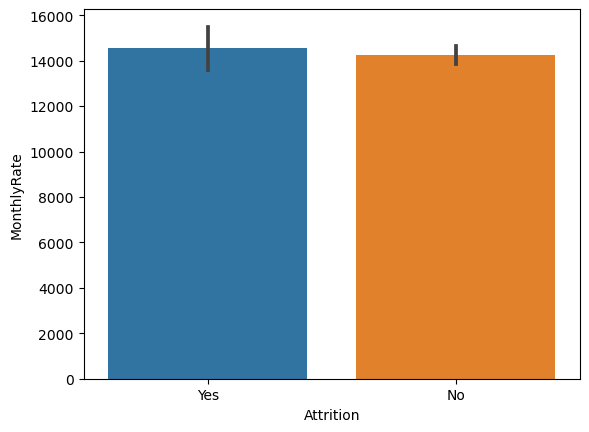

In [54]:
x = df['Attrition']
y = df['MonthlyRate']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='NumCompaniesWorked'>

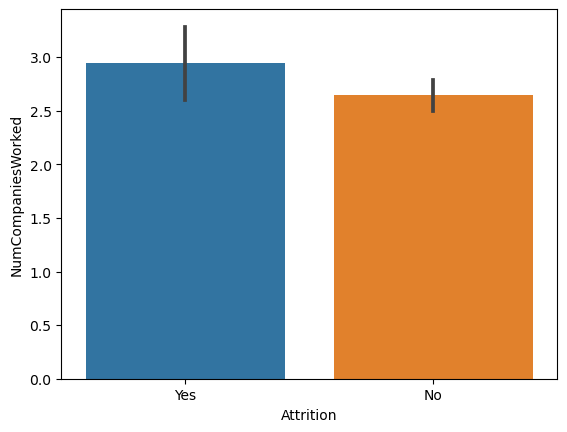

In [55]:
x = df['Attrition']
y = df['NumCompaniesWorked']
sns.barplot(x,y)

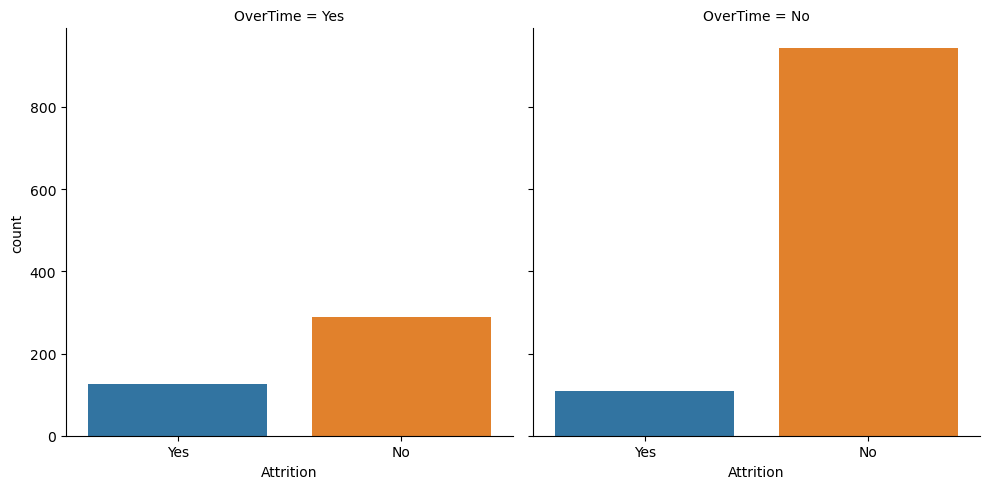

In [56]:
sns.factorplot(data=df, kind='count', x='Attrition', col='OverTime')

In [57]:
pd.crosstab(columns=[df.Attrition], index=[df.OverTime], margins=True, normalize='index') # Set normalize=index to view row-wise %.

Attrition,No,Yes
OverTime,,
No,0.895636,0.104364
Yes,0.694712,0.305288
All,0.838776,0.161224


<AxesSubplot:xlabel='Attrition', ylabel='PercentSalaryHike'>

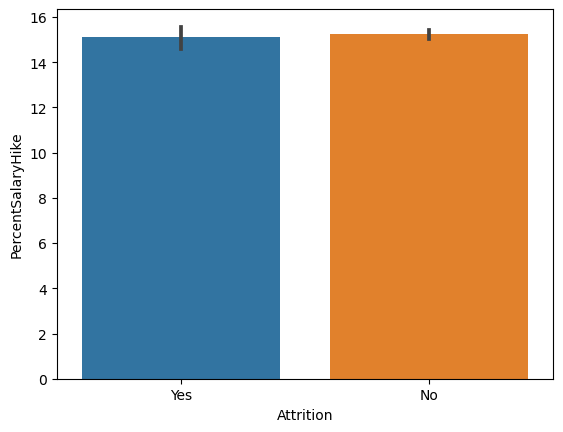

In [58]:
x = df['Attrition']
y = df['PercentSalaryHike']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='PerformanceRating'>

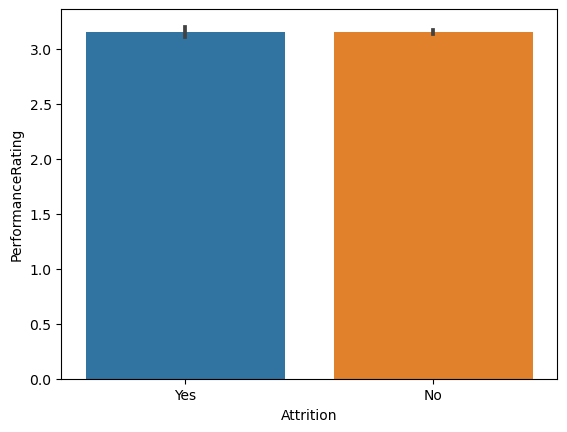

In [59]:
x = df['Attrition']
y = df['PerformanceRating']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='RelationshipSatisfaction'>

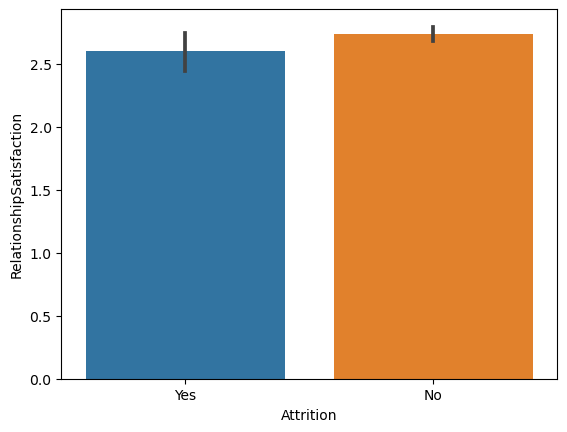

In [60]:
x = df['Attrition']
y = df['RelationshipSatisfaction']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='StockOptionLevel'>

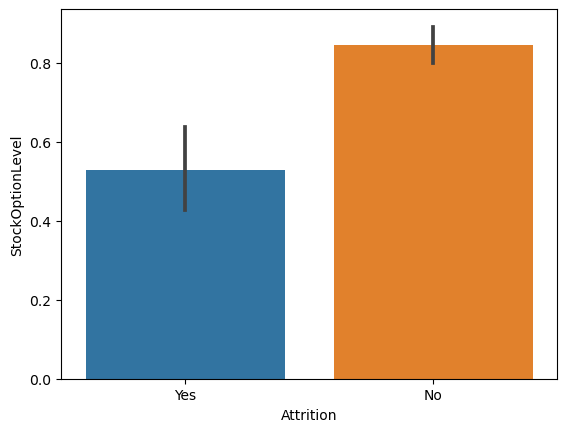

In [61]:
x = df['Attrition']
y = df['StockOptionLevel']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='TotalWorkingYears'>

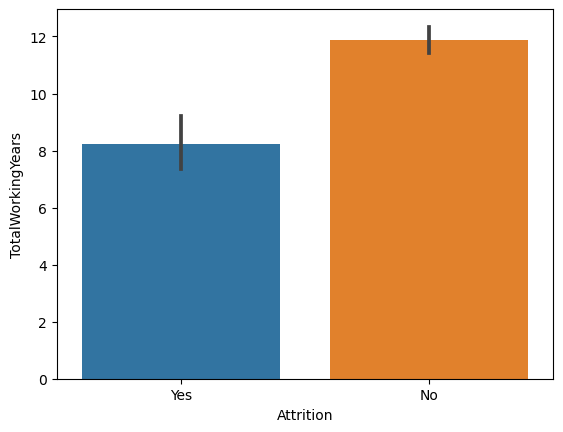

In [62]:
x = df['Attrition']
y = df['TotalWorkingYears']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='TrainingTimesLastYear'>

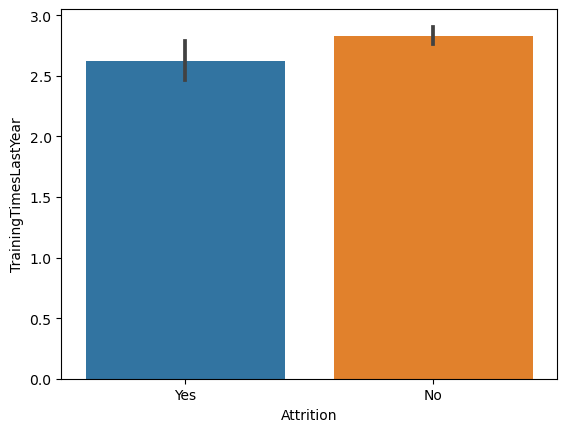

In [63]:
x = df['Attrition']
y = df['TrainingTimesLastYear']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='WorkLifeBalance'>

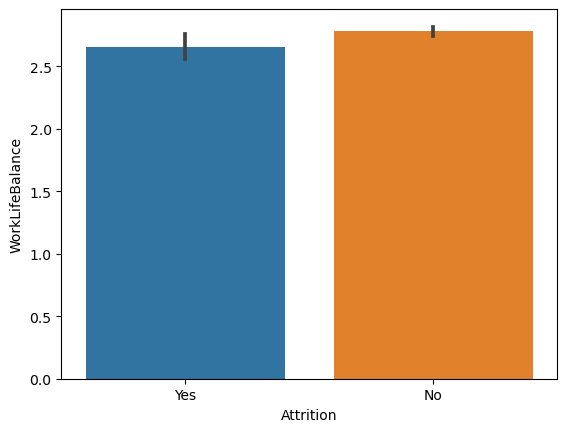

In [64]:
x = df['Attrition']
y = df['WorkLifeBalance']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='YearsAtCompany'>

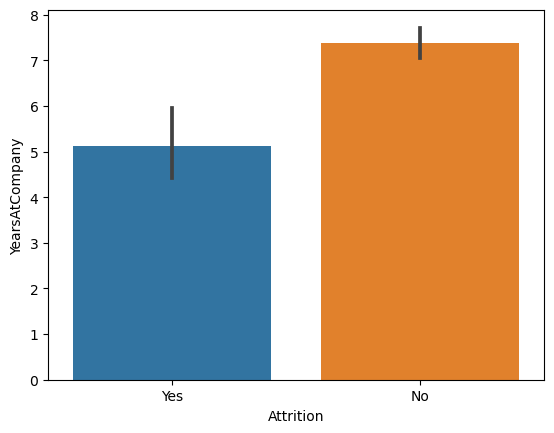

In [65]:
x = df['Attrition']
y = df['YearsAtCompany']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='YearsInCurrentRole'>

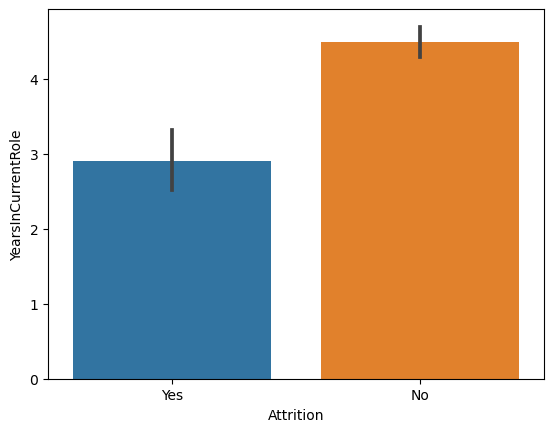

In [66]:
x = df['Attrition']
y = df['YearsInCurrentRole']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='YearsSinceLastPromotion'>

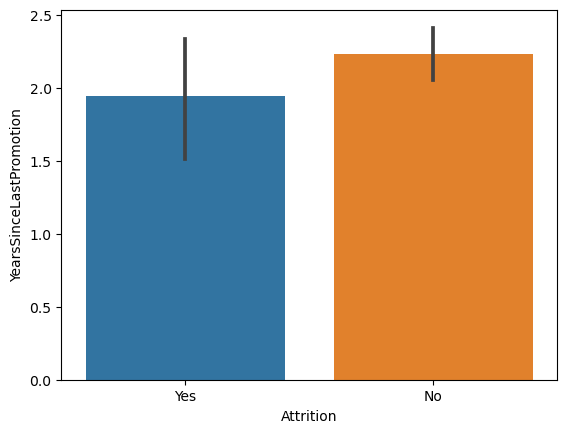

In [67]:
x = df['Attrition']
y = df['YearsSinceLastPromotion']
sns.barplot(x,y)

<AxesSubplot:xlabel='Attrition', ylabel='YearsWithCurrManager'>

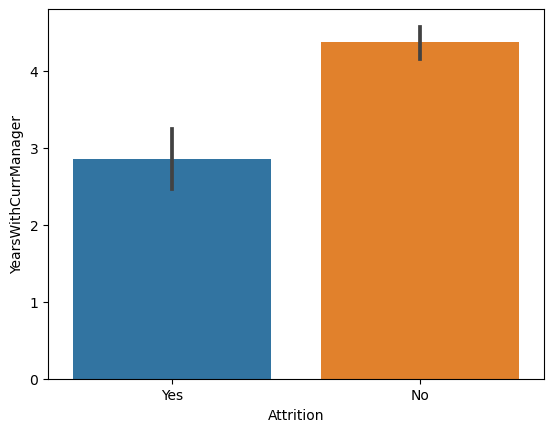

In [68]:
x = df['Attrition']
y = df['YearsWithCurrManager']
sns.barplot(x,y)

### Multivariate Analysis

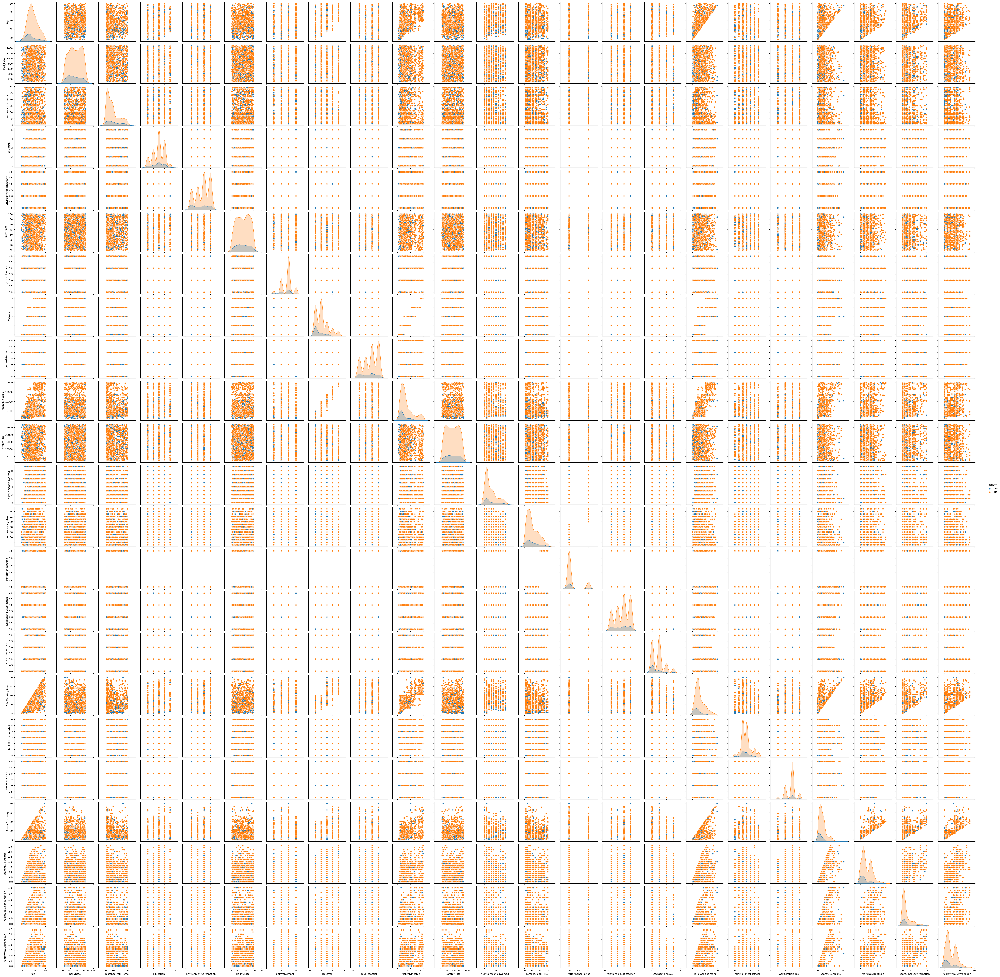

In [69]:
sns.pairplot(df, hue='Attrition')

# Outliers Detection

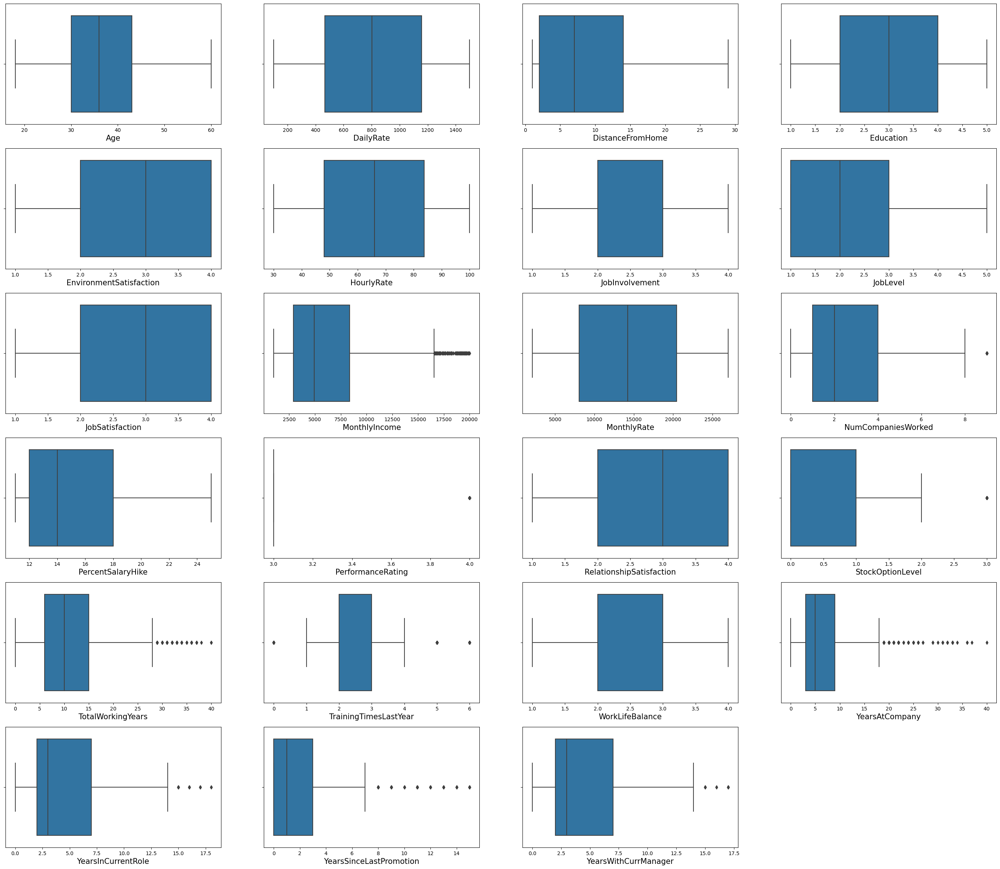

In [70]:
plt.figure(figsize=(35,30))
plotnumber = 1

for column in numerical_columns:
    if plotnumber<=24:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize = 15)
    plotnumber+=1
plt.show()

<b> As we can see, outliers are present in the columns 'MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager' . So, let's remove them.</b>

In [71]:
features = df[['MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager' ]]

from scipy.stats import zscore

z = np.abs(zscore(features))
z

,MonthlyIncome,NumCompaniesWorked,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.108350,2.125136,0.426230,0.932014,0.421642,2.171982,0.164613,0.063296,0.679146,0.245834
1,0.291719,0.678049,2.346151,0.241988,0.164511,0.155707,0.488508,0.764998,0.368715,0.806541
2,0.937654,1.324226,0.426230,0.932014,0.550208,0.155707,1.144294,1.167687,0.679146,1.155935
3,0.763634,0.678049,0.426230,0.932014,0.421642,0.155707,0.161947,0.764998,0.252146,1.155935
4,0.644858,2.525591,0.426230,0.241988,0.678774,0.155707,0.817734,0.615492,0.058285,0.595227
...,...,...,...,...,...,...,...,...,...,...
1465,0.835451,0.523316,0.426230,0.241988,0.735447,0.155707,0.327893,0.615492,0.679146,0.314873
1466,0.741140,0.523316,0.426230,0.241988,0.293077,1.707500,0.001333,0.764998,0.368715,0.806541
1467,0.076690,0.678049,2.346151,0.241988,0.678774,2.171982,0.164613,0.615492,0.679146,0.314873
1468,0.236474,0.277594,0.426230,0.932014,0.735447,0.155707,0.325228,0.488900,0.679146,1.086895


In [72]:
# Now, let's create a new dataframe

df_new = df[(z<3).all(axis=1)]
df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,3,4,0,17,3,2,9,6,0,8


In [73]:
print(df.shape) 
print(df_new.shape) 

(1470, 31)
(1387, 31)


### Percentage data loss

In [74]:
loss_percent = (1470-1387)/1470*100
print(loss_percent, '%')

5.646258503401361 %


In [75]:
df_new.shape

(1387, 31)

### Checking for Skewness

In [76]:
df_new.skew().sort_values()

WorkLifeBalance            -0.557100
JobInvolvement             -0.501401
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
HourlyRate                 -0.030481
DailyRate                  -0.017078
MonthlyRate                 0.030596
Age                         0.472280
TrainingTimesLastYear       0.577614
YearsWithCurrManager        0.694506
YearsInCurrentRole          0.726675
PercentSalaryHike           0.800592
DistanceFromHome            0.954752
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
NumCompaniesWorked          1.037715
JobLevel                    1.126075
YearsAtCompany              1.248623
MonthlyIncome               1.544770
YearsSinceLastPromotion     1.756335
PerformanceRating           1.931566
dtype: float64

<b>The columns which do not lie in the range of +/-0.5 are 'WorkLifeBalance', 'JobInvolvement', 'TrainingTimesLastYear', 'YearsWithCurrManager', 'YearsInCurrentRole', 'PercentSalaryHike', 'DistanceFromHome', 'StockOptionLevel', 'TotalWorkingYears', 'NumCompaniesWorked', 'JobLevel', 'YearsAtCompany', 'MonthlyIncome', 'YearsSinceLastPromotion' and 'PerformanceRating'.</b>               

<b>Thus, skewness is present in these columns.</b>

### Removing Skewness using yeo-johnson method

In [77]:
skewed_features = ['WorkLifeBalance', 'JobInvolvement', 'TrainingTimesLastYear', 'YearsWithCurrManager', 'YearsInCurrentRole', 'PercentSalaryHike', 'DistanceFromHome', 'StockOptionLevel', 'TotalWorkingYears', 'NumCompaniesWorked', 'JobLevel', 'YearsAtCompany', 'MonthlyIncome', 'YearsSinceLastPromotion', 'PerformanceRating']

In [78]:
from sklearn.preprocessing import PowerTransformer

scaler = PowerTransformer(method='yeo-johnson')

In [79]:
df_new[skewed_features] = scaler.fit_transform(df_new[skewed_features].values)
df_new[skewed_features].head()

,WorkLifeBalance,JobInvolvement,TrainingTimesLastYear,YearsWithCurrManager,YearsInCurrentRole,PercentSalaryHike,DistanceFromHome,StockOptionLevel,TotalWorkingYears,NumCompaniesWorked,JobLevel,YearsAtCompany,MonthlyIncome,YearsSinceLastPromotion,PerformanceRating
0,-2.14795,0.322170,-2.608524,0.582177,0.290524,-1.495549,-1.489968,-1.084263,-0.173231,1.620671,0.349828,0.231837,0.386674,-1.073534,0.0
1,0.27486,-1.065841,0.217074,1.018073,1.006575,1.690425,0.244561,0.548653,0.147620,-0.561880,0.349828,0.948319,0.144235,0.193168,0.0
2,0.27486,-1.065841,0.217074,-1.528426,-1.571814,0.193797,-1.028366,-1.084263,-0.351153,1.273711,-1.141761,-2.156089,-1.431153,-1.073534,0.0
3,0.27486,0.322170,0.217074,-1.528426,1.006575,-1.495549,-0.698191,-1.084263,-0.173231,-0.561880,-1.141761,0.621429,-0.814425,1.027520,0.0
4,0.27486,0.322170,0.217074,-0.347871,-0.390769,-0.957525,-1.028366,0.548653,-0.544046,1.764103,-1.141761,-0.933983,-0.504453,0.722874,0.0


In [80]:
# Now, let's check the skewness again after applying yeo-johnson method

df_new.skew()

Age                         0.472280
DailyRate                  -0.017078
DistanceFromHome           -0.008149
Education                  -0.289024
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.018801
JobLevel                    0.110769
JobSatisfaction            -0.345612
MonthlyIncome               0.027700
MonthlyRate                 0.030596
NumCompaniesWorked          0.016175
PercentSalaryHike           0.112128
PerformanceRating           0.000000
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.089929
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.057949
WorkLifeBalance            -0.011133
YearsAtCompany             -0.025230
YearsInCurrentRole         -0.069631
YearsSinceLastPromotion     0.212301
YearsWithCurrManager       -0.070570
dtype: float64

<b>We can see that the skewness has been removed.</b>

<b>Now, let's visualize the data using distplot</b>

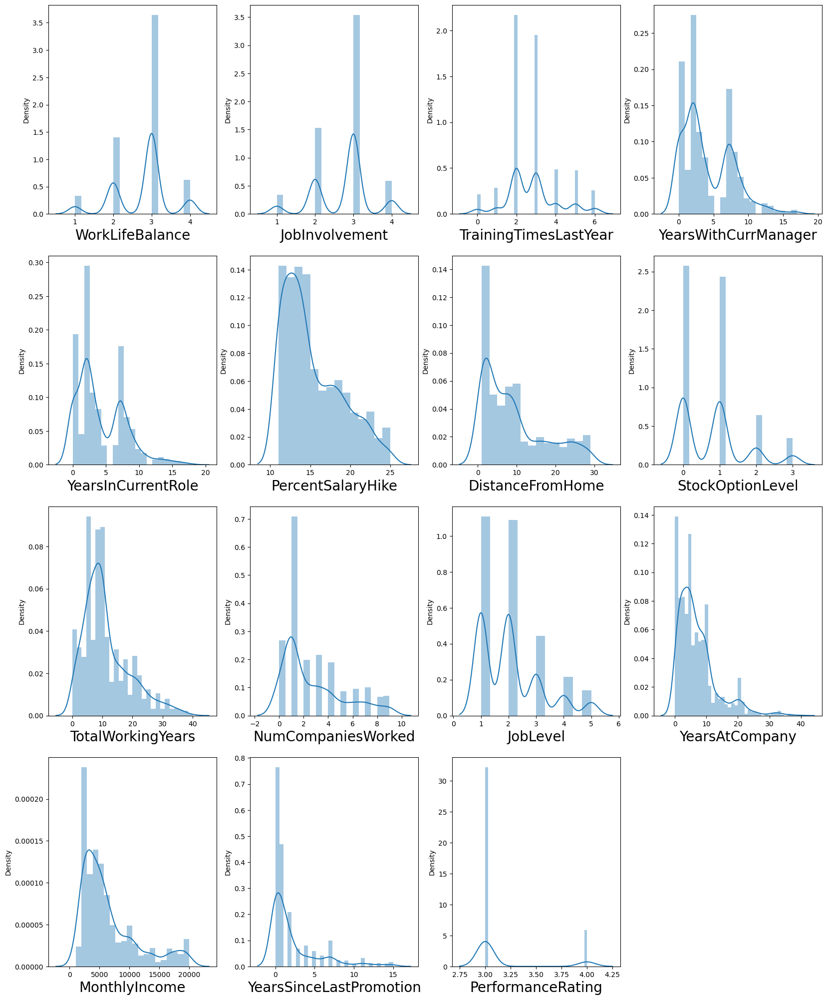

In [81]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in df_new[skewed_features]:
    if plotnumber<=16:
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

### Encoding the categorical columns using Label Encoding

In [82]:
from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()

df_new[categorical_columns] = df_new[categorical_columns].apply(LE.fit_transform)
df_new[categorical_columns]

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,1,2,2,1,0,7,2,1
1,0,1,1,1,1,6,1,0
2,1,2,1,4,1,2,2,1
3,0,1,1,1,0,6,1,1
4,0,2,1,3,1,2,1,0
...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0
1466,0,2,1,3,1,0,1,0
1467,0,2,1,1,1,4,1,1
1468,0,1,2,3,1,7,1,0


### Correlation between features and labels

In [83]:
df_new.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.022340,0.021946,-0.038242,-0.028793,0.198502,-0.032676,0.014098,-0.039430,...,NaN,0.041744,0.077833,0.634884,-0.013707,-0.017500,0.174149,0.118454,0.103938,0.114962
Attrition,-0.159366,1.000000,-0.001041,-0.057220,0.063637,0.080979,-0.032703,0.023585,-0.112393,0.036252,...,NaN,-0.052344,-0.175081,-0.220878,-0.059071,-0.051039,-0.201954,-0.187047,-0.050986,-0.186821
BusinessTravel,0.022340,-0.001041,1.000000,-0.004606,-0.003521,-0.015034,-0.010560,0.022576,0.001183,-0.025364,...,NaN,-0.029660,-0.012732,0.031888,0.011688,-0.015374,-0.021107,-0.032472,-0.027478,-0.033222
DailyRate,0.021946,-0.057220,-0.004606,1.000000,-0.005398,-0.003967,-0.018442,0.040645,0.033123,-0.005242,...,NaN,0.004516,0.047773,0.043307,0.006581,-0.045668,0.005806,0.020542,-0.035403,0.007098
Department,-0.038242,0.063637,-0.003521,-0.005398,1.000000,0.037660,0.012846,0.013432,-0.014540,-0.030618,...,NaN,-0.037705,-0.001271,-0.007789,0.039412,0.021020,0.026334,0.057983,0.017842,0.023995
DistanceFromHome,-0.028793,0.080979,-0.015034,-0.003967,0.037660,1.000000,0.003595,0.011891,-0.012075,0.010557,...,NaN,0.010099,0.027082,-0.012129,-0.015334,-0.030011,0.006570,0.013091,-0.003873,-0.002310
Education,0.198502,-0.032703,-0.010560,-0.018442,0.012846,0.003595,1.000000,-0.038017,-0.026223,-0.019166,...,NaN,-0.002393,0.026805,0.152263,-0.023484,0.009328,0.038266,0.050563,0.015762,0.026340
EducationField,-0.032676,0.023585,0.022576,0.040645,0.013432,0.011891,-0.038017,1.000000,0.047924,0.010676,...,NaN,-0.013734,-0.017331,-0.008101,0.048844,0.037963,0.002739,0.002909,0.019765,0.025918
EnvironmentSatisfaction,0.014098,-0.112393,0.001183,0.033123,-0.014540,-0.012075,-0.026223,0.047924,1.000000,-0.015715,...,NaN,0.018414,0.025227,-0.014091,-0.016757,0.031085,0.014305,0.031007,0.039876,0.007643
Gender,-0.039430,0.036252,-0.025364,-0.005242,-0.030618,0.010557,-0.019166,0.010676,-0.015715,1.000000,...,NaN,0.041458,0.024390,-0.049776,-0.039213,0.002726,-0.046018,-0.028101,-0.016131,-0.027972


### Correlation between features and labels using Heatmap

<AxesSubplot:>

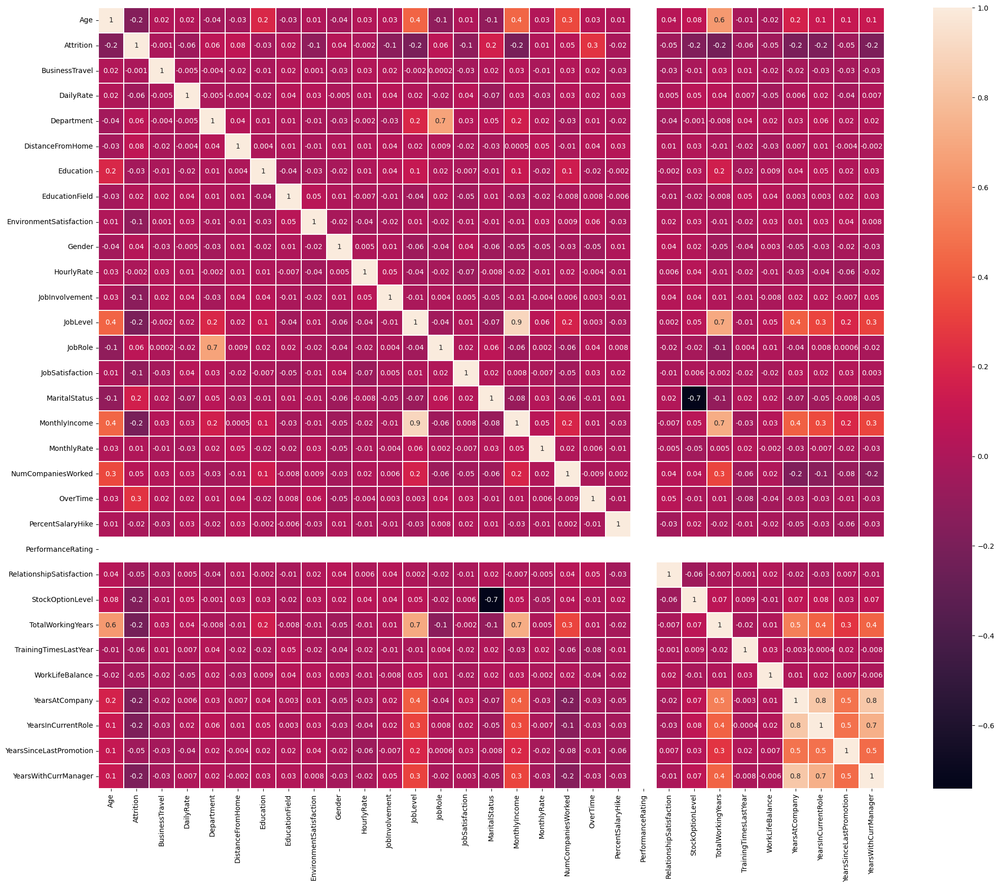

In [84]:
plt.figure(figsize=(25,20))

sns.heatmap(df_new.corr(), linewidths=0.1, fmt='.1g', annot = True)

<b>The heatmap contains both positive and negative correlations.</b>

<b>Positively correlated columns:</b>
* The column 'Department' is 6% correlated with the target column 'Attrition'
* The column 'DistanceFromHome' is 8% correlated with the target column 'Attrition'
* The 'EducationField' is 2% correlated with the target column 'Attrition'
* The column 'Gender' 4% correlated with the target column 'Attrition'
* The column 'JobRole' 6% correlated with the target column 'Attrition'
* The column MaritalStatus' 20% correlated with the target column 'Attrition'
* The column 'MonthlyRate' 1% correlated with the target column 'Attrition'
* The column 'NumCompaniesWorked' 5% correlated with the target column 'Attrition'
* The column 'Overtime' 30% correlated with the target column 'Attrition'
* The column 'PerformanceRating' 1% correlated with the target column 'Attrition'

<b>Negatively correlated columns:</b>          
'Age', 'BusinessTravel', 'DailyRate', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingHours', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole' and 'YearsWithCurrManager'.</b>

<b>As the columns 'BusinessTravel' and 'HourlyRate' have very less correlation with the target column 'Attrition', we will drop these columns.</b>

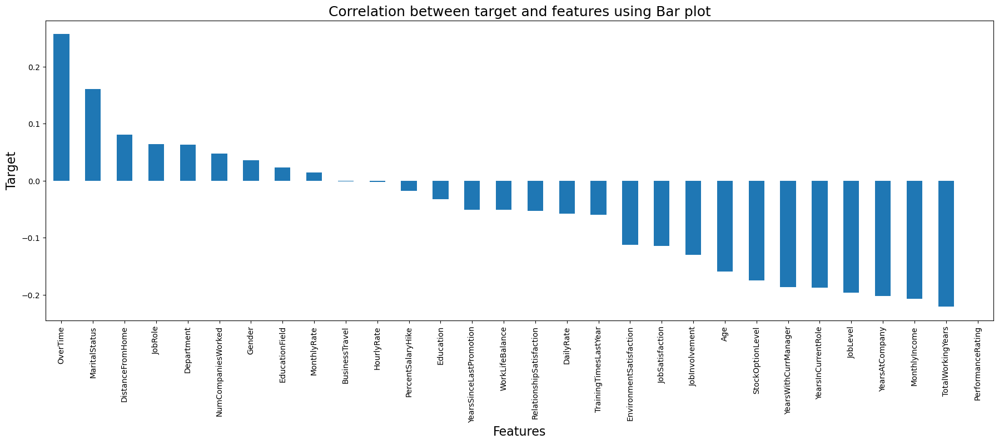

In [85]:
plt.figure(figsize=(22,7))
df_new.corr()['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar')
plt.xlabel('Features',fontsize=16)
plt.ylabel('Target',fontsize=16)
plt.title('Correlation between target and features using Bar plot',fontsize=18)
plt.show()

In [86]:
# Now, let's drop the columns 'BussinessTravel' and 'HourlyRate'

df_new.drop('BusinessTravel',axis=1, inplace=True)
df_new.drop('HourlyRate',axis = 1, inplace=True)
df_new.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,-1.489968,2,1,2,0,0.322170,...,0.0,1,-1.084263,-0.173231,-2.608524,-2.14795,0.231837,0.290524,-1.073534,0.582177
1,49,0,279,1,0.244561,1,1,3,1,-1.065841,...,0.0,4,0.548653,0.147620,0.217074,0.27486,0.948319,1.006575,0.193168,1.018073
2,37,1,1373,1,-1.028366,2,4,4,1,-1.065841,...,0.0,2,-1.084263,-0.351153,0.217074,0.27486,-2.156089,-1.571814,-1.073534,-1.528426
3,33,0,1392,1,-0.698191,4,1,4,0,0.322170,...,0.0,3,-1.084263,-0.173231,0.217074,0.27486,0.621429,1.006575,1.027520,-1.528426
4,27,0,591,1,-1.028366,1,3,1,1,0.322170,...,0.0,4,0.548653,-0.544046,0.217074,0.27486,-0.933983,-0.390769,0.722874,-0.347871


In [87]:
df_new.shape

(1387, 29)

<b>By checking out the shape of the dataset, we can confirm that the columns 'BusinessTravel' and 'HourlyRate' have been deleted.</b>

### Seperating dependent and independent variables

In [88]:
x = df_new.drop('Attrition', axis=1)

y = df_new['Attrition']

In [89]:
x.shape

(1387, 28)

In [90]:
y.shape

(1387,)

### Balancing the dataset using SMOTE

In [95]:
#from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [96]:
y.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

<AxesSubplot:xlabel='Attrition', ylabel='count'>

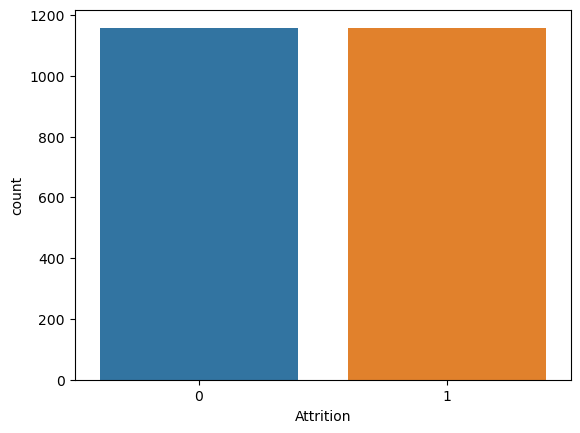

In [97]:
sns.countplot(y)

<b>Now, the dataset is balanced.</b>

### Data Standardization using Standard Scaler

In [98]:
scaler = StandardScaler()

x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.730205,0.822767,1.630357,-1.661802,-0.771230,-0.918850,-0.435889,-1.049587,0.476058,0.572493,...,0.0,-1.426609,-0.969103,0.024008,-2.707349,-2.121694,0.421430,0.480360,-1.096993,0.777005
1,1.670584,-1.300415,-0.324046,0.199496,-1.799536,-0.918850,0.497123,0.952755,-1.009354,0.572493,...,0.0,1.439811,0.753081,0.356719,0.283578,0.334827,1.168892,1.239721,0.254322,1.234161
2,0.260015,1.521895,-0.324046,-1.166463,-0.771230,1.470435,1.430135,0.952755,-1.009354,-1.016159,...,0.0,-0.471136,-0.969103,-0.160490,0.283578,0.334827,-2.069746,-1.494621,-1.096993,-1.436534
3,-0.210174,1.570912,-0.324046,-0.812157,1.285383,-0.918850,1.430135,-1.049587,0.476058,-1.016159,...,0.0,0.484337,-0.969103,0.024008,0.283578,0.334827,0.827867,1.239721,1.144408,-1.436534
4,-0.915459,-0.495515,-0.324046,-1.166463,-1.799536,0.674007,-1.368901,0.952755,0.476058,-1.016159,...,0.0,1.439811,0.753081,-0.360513,0.283578,0.334827,-0.794798,-0.242141,0.819412,-0.198402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,-0.797911,-0.242694,-0.324046,-0.773393,-0.771230,-0.918850,-0.435889,-1.049587,-0.204655,-1.016159,...,0.0,-0.471136,0.753081,-0.075941,-0.560106,-0.995956,-0.051187,0.436945,0.560451,0.458092
2312,-0.210174,0.538988,-0.324046,1.575811,0.257077,0.674007,-1.368901,-1.049587,-1.009354,-0.813828,...,0.0,-0.471136,-0.969103,-0.388868,-2.229063,0.334827,-0.489910,-0.053411,0.860803,0.009122
2313,-0.915459,0.686037,-0.324046,-1.084326,0.257077,-0.122422,-1.368901,-1.049587,-1.538496,-0.647867,...,0.0,0.484337,-0.969103,-0.636566,0.870809,-0.745991,-0.496863,-0.242141,0.819412,-0.485434
2314,-1.150553,-0.188518,-0.324046,0.718758,0.257077,0.674007,-0.435889,-1.049587,-0.179754,-1.016159,...,0.0,-0.471136,-0.007266,-1.610716,0.732735,0.322153,-1.018498,-0.465650,-0.026684,-0.745039


<b>The data has been scaled now.</b>

### Checking VIF values to solve multicollinearity

In [99]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.901653,Age
1,1.041157,DailyRate
2,1.977026,Department
3,1.040224,DistanceFromHome
4,1.070030,Education
5,1.046131,EducationField
6,1.060845,EnvironmentSatisfaction
7,1.047764,Gender
8,1.034486,JobInvolvement
9,5.814385,JobLevel


<b> As none of the columns have vif greater than 10, there is no multicollinearity probem.</b>

### Finding best random state

In [100]:
from sklearn.linear_model import LogisticRegression

maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state =i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ", maxAccu, " on Random_state ", maxRS)

Best accuracy is  0.8201438848920863  on Random_state  73


### Train Test Split

In [101]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state=73)

### Logistic Regression

In [102]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score


lr = LogisticRegression()

lr.fit(x_train, y_train)
predlr = lr.predict(x_test)

ACC = accuracy_score(y_test, predlr)
print("Accuracy score",ACC)

print(confusion_matrix(y_test, predlr))
print(classification_report(y_test, predlr))

CVS = cross_val_score(lr, x, y, cv=5).mean()
print("Cross validation score:", CVS)

Diff = ACC-CVS
print("Difference:", Diff)

Accuracy score 0.8201438848920863
[[277  63]
 [ 62 293]]
              precision    recall  f1-score   support

           0       0.82      0.81      0.82       340
           1       0.82      0.83      0.82       355

    accuracy                           0.82       695
   macro avg       0.82      0.82      0.82       695
weighted avg       0.82      0.82      0.82       695

Cross validation score: 0.7789714753854174
Difference: 0.041172409506668894


<b> Accuracy score of Logistic Regression is 77.89%.</b>

### Decision Tree Classifier

In [103]:
from sklearn.tree import DecisionTreeClassifier

DTC = DecisionTreeClassifier()

DTC.fit(x_train, y_train)
predDTC = DTC.predict(x_test)

ACC = accuracy_score(y_test, predDTC)
print("Accuracy score",ACC)

print(confusion_matrix(y_test, predDTC))
print(classification_report(y_test, predDTC))

CVS = cross_val_score(DTC, x, y, cv=5).mean()
print("Cross validation score:", CVS)

Diff = ACC-CVS
print("Difference:", Diff)

Accuracy score 0.8647482014388489
[[293  47]
 [ 47 308]]
              precision    recall  f1-score   support

           0       0.86      0.86      0.86       340
           1       0.87      0.87      0.87       355

    accuracy                           0.86       695
   macro avg       0.86      0.86      0.86       695
weighted avg       0.86      0.86      0.86       695

Cross validation score: 0.8273748789751991
Difference: 0.03737332246364977


<b> Accuracy score of Decision Tree Classifier is 86.47%.</b>

### KNeighbors Classifier

In [104]:
from sklearn.neighbors import KNeighborsClassifier

knc = KNeighborsClassifier()

knc.fit(x_train, y_train)
predknc=knc.predict(x_test)

ACC = accuracy_score(y_test, predknc)
print("Accuracy score",ACC)

print(confusion_matrix(y_test, predknc))
print(classification_report(y_test,predknc))

CVS = cross_val_score(knc, x, y, cv=5).mean()
print("Cross validation score:", CVS)

Diff = ACC-CVS
print("Difference:", Diff)

Accuracy score 0.7798561151079136
[[194 146]
 [  7 348]]
              precision    recall  f1-score   support

           0       0.97      0.57      0.72       340
           1       0.70      0.98      0.82       355

    accuracy                           0.78       695
   macro avg       0.83      0.78      0.77       695
weighted avg       0.83      0.78      0.77       695

Cross validation score: 0.8018302673717137
Difference: -0.021974152263800062


<b> Accuracy score of KNeighbors Classifier is 77.98%.</b>

### Random Forest Classifier

In [105]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)
predrfc = rfc.predict(x_test)

ACC = accuracy_score(y_test, predrfc)
print("Accuracy score",ACC)

print(confusion_matrix(y_test, predrfc))
print(classification_report(y_test,predrfc))


CVS = cross_val_score(rfc, x, y, cv=5).mean()
print("Cross validation score:", CVS)

Diff = ACC-CVS
print("Difference:", Diff)

Accuracy score 0.9179856115107914
[[327  13]
 [ 44 311]]
              precision    recall  f1-score   support

           0       0.88      0.96      0.92       340
           1       0.96      0.88      0.92       355

    accuracy                           0.92       695
   macro avg       0.92      0.92      0.92       695
weighted avg       0.92      0.92      0.92       695

Cross validation score: 0.8943434870037983
Difference: 0.0236421245069931


<b> Accuracy score of Random Forest Classifier is 91.79%.</b>

### Support Vector Classifer

In [106]:
from sklearn.svm import SVC

svc = SVC()

svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)

ACC = accuracy_score(y_test, predsvc)
print("Accuracy score",ACC)

print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))


CVS = cross_val_score(svc, x, y, cv=5).mean()
print("Cross validation score:", CVS)

Diff = ACC-CVS
print("Difference:", Diff)

Accuracy score 0.9007194244604316
[[304  36]
 [ 33 322]]
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       340
           1       0.90      0.91      0.90       355

    accuracy                           0.90       695
   macro avg       0.90      0.90      0.90       695
weighted avg       0.90      0.90      0.90       695

Cross validation score: 0.8713999776569598
Difference: 0.02931944680347187


<b> Accuracy score of Support Vector Classifier is 90%.</b>

### AdaBoost Classifier

In [107]:
from sklearn.ensemble import AdaBoostClassifier


ABC = AdaBoostClassifier()

ABC.fit(x_train,y_train)
predABC = ABC.predict(x_test)

ACC = accuracy_score(y_test, predABC)
print("Accuracy score",ACC)

print(confusion_matrix(y_test, predABC))
print(classification_report(y_test,predABC))

CVS = cross_val_score(ABC, x, y, cv=5).mean()
print("Cross validation score:", CVS)

Diff = ACC-CVS
print("Difference:", Diff)

Accuracy score 0.897841726618705
[[312  28]
 [ 43 312]]
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       340
           1       0.92      0.88      0.90       355

    accuracy                           0.90       695
   macro avg       0.90      0.90      0.90       695
weighted avg       0.90      0.90      0.90       695

Cross validation score: 0.8546091829894987
Difference: 0.043232543629206255


<b> Accuracy score of AdaBoost Classifier is 89.78%.</b>

### Hyperparameter Tuning

In [108]:
# Now, let's perform Hyperparameter Tuning for Random Forest Classifier

from sklearn.model_selection import GridSearchCV

parameters = {'n_estimators':[80, 90, 100, 110],
             'criterion':['gini', 'entropy', 'log_loss'],
             'max_depth':[2,4,6],
             'max_features':[2,3],
             'bootstrap':['True']}

GCV = GridSearchCV(RandomForestClassifier(), parameters, cv=5)

GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': ['True'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6], 'max_features': [2, 3],
                         'n_estimators': [80, 90, 100, 110]})

In [109]:
GCV.best_params_

{'bootstrap': 'True',
 'criterion': 'entropy',
 'max_depth': 6,
 'max_features': 3,
 'n_estimators': 80}

In [110]:
# Creating the Final Model

Attrition = RandomForestClassifier(bootstrap='True', criterion= 'gini', max_depth= 6, max_features=3, n_estimators= 100)
Attrition.fit(x_train,y_train)
pred = Attrition.predict(x_test)
print(accuracy_score(y_test, predrfc)*100)
print('R2_score:',r2_score(y_test, predrfc)*100)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, predrfc)))

91.79856115107914
R2_score: 67.17895608947804
RMSE value: 0.2863815435554614


<b> After Hyperparameter Tuning, the accuracy score is 91.79%.</b>

### Plotting ROC-AUC curves

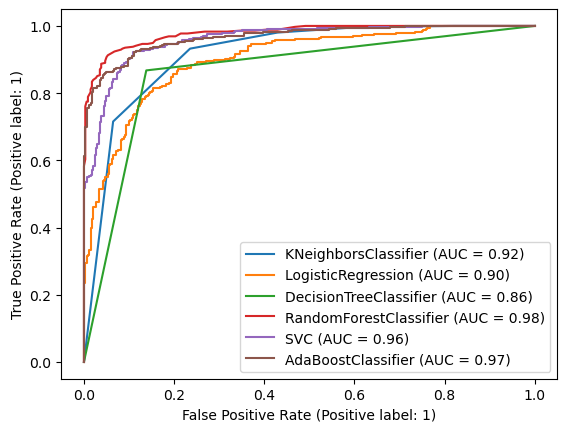

In [111]:
from sklearn.metrics import plot_roc_curve 

disp = plot_roc_curve(knc, x_test, y_test)
plot_roc_curve(LR, x_test, y_test, ax=disp.ax_)     
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rfc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ABC, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

### Saving the model

In [112]:
import joblib

joblib.dump(Attrition,"HR.pkl")

['HR.pkl']

In [113]:
loadmodel = joblib.load("HR.pkl")

In [114]:
a = np.array(y_test)
predicted = np.array(loadmodel.predict(x_test))
df_final = pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_final

,Original,Predicted
0,0,0
1,1,1
2,1,1
3,0,0
4,1,1
...,...,...
690,1,0
691,0,0
692,1,1
693,1,1
